In [ ]:
import torch
from torchvision import datasets,transforms

In [ ]:
transform = transforms.ToTensor()  # Converts PIL image to tensor

In [ ]:
image_data_train=datasets.CIFAR100(root="train",download=True,train=True,transform=transform)
image_data_test=datasets.CIFAR100(root="test/",download=True,train=False,transform=transform)

In [ ]:
image_data_train

Dataset CIFAR100
    Number of datapoints: 50000
    Root location: train
    Split: Train
    StandardTransform
Transform: ToTensor()

In [ ]:
image_data_test

Dataset CIFAR100
    Number of datapoints: 10000
    Root location: test/
    Split: Test
    StandardTransform
Transform: ToTensor()

In [ ]:
for i,im in image_data_train:
    print(i,im)
    break

tensor([[[1.0000, 1.0000, 1.0000,  ..., 0.7647, 0.8314, 0.7137],
         [1.0000, 0.9961, 0.9961,  ..., 0.6667, 0.6314, 0.5725],
         [1.0000, 0.9961, 1.0000,  ..., 0.7412, 0.6510, 0.4745],
         ...,
         [0.5804, 0.5569, 0.5490,  ..., 0.1176, 0.2549, 0.2980],
         [0.4784, 0.4706, 0.4941,  ..., 0.0863, 0.3804, 0.5529],
         [0.3412, 0.3451, 0.3961,  ..., 0.1333, 0.4118, 0.5412]],

        [[1.0000, 1.0000, 1.0000,  ..., 0.8039, 0.8784, 0.7608],
         [1.0000, 0.9961, 0.9961,  ..., 0.6902, 0.6588, 0.6039],
         [1.0000, 0.9961, 1.0000,  ..., 0.7804, 0.6980, 0.5216],
         ...,
         [0.7255, 0.7137, 0.7020,  ..., 0.0667, 0.2431, 0.3020],
         [0.6157, 0.6078, 0.6275,  ..., 0.0627, 0.4392, 0.6314],
         [0.4784, 0.4784, 0.5255,  ..., 0.1412, 0.5216, 0.6784]],

        [[1.0000, 1.0000, 1.0000,  ..., 0.7569, 0.8000, 0.6549],
         [1.0000, 0.9961, 0.9961,  ..., 0.5882, 0.5098, 0.4431],
         [1.0000, 0.9961, 1.0000,  ..., 0.6627, 0.5098, 0.

In [ ]:
# Training data and labels
X_train = torch.stack([img for img, label in image_data_train])
y_train = torch.tensor([label for img, label in image_data_train])

# Testing data and labels
X_test = torch.stack([img for img, label in image_data_test])
y_test = torch.tensor([label for img, label in image_data_test])


In [ ]:
X_train.shape , y_train.shape

(torch.Size([50000, 3, 32, 32]), torch.Size([50000]))

In [ ]:
# reshaping the data into 50000 x 3072
X_train_reshaped = X_train.reshape(-1, 3072)
X_test_rehaped = X_test.reshape(-1, 3072)

In [ ]:
X_train_reshaped.shape

torch.Size([50000, 3072])

In [ ]:
y_test

tensor([49, 33, 72,  ..., 51, 42, 70])

In [ ]:
# creating a dataframe
import pandas as pd
y_df=pd.DataFrame(y_train,columns=["labels"])

In [ ]:
print(y_train.unique())

tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35,
        36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53,
        54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71,
        72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89,
        90, 91, 92, 93, 94, 95, 96, 97, 98, 99])


In [ ]:
len(y_train.unique())

100

In [ ]:
y_df.index[y_df['labels']==1]

Index([    4,   271,   282,   502,   543,   643,   732,   960,  1017,  1129,
       ...
       49445, 49624, 49675, 49682, 49726, 49765, 49820, 49877, 49919, 49971],
      dtype='int64', length=500)

In [ ]:
img_list=[]
for i in range(100):
  print(i)
  img_list.append(y_df.index[y_df['labels']==i])
  print(f"Indices for category {i}: {img_list[i]}")

0
Indices for category 0: Index([    2,   176,   304,   317,   353,   441,   459,   587,   658,   789,
       ...
       48751, 48823, 48921, 48994, 49474, 49497, 49554, 49677, 49748, 49754],
      dtype='int64', length=500)
1
Indices for category 1: Index([    4,   271,   282,   502,   543,   643,   732,   960,  1017,  1129,
       ...
       49445, 49624, 49675, 49682, 49726, 49765, 49820, 49877, 49919, 49971],
      dtype='int64', length=500)
2
Indices for category 2: Index([  202,   260,   308,   382,   562,   580,   795,  1106,  1195,  1198,
       ...
       48779, 49012, 49117, 49211, 49547, 49601, 49608, 49707, 49862, 49976],
      dtype='int64', length=500)
3
Indices for category 3: Index([  342,   360,   383,   386,   395,   612,   679,   744,   939,   943,
       ...
       48730, 48804, 48849, 49091, 49376, 49380, 49924, 49954, 49969, 49997],
      dtype='int64', length=500)
4
Indices for category 4: Index([  102,   113,   145,   389,   488,   638,   651,   825,   916,   95

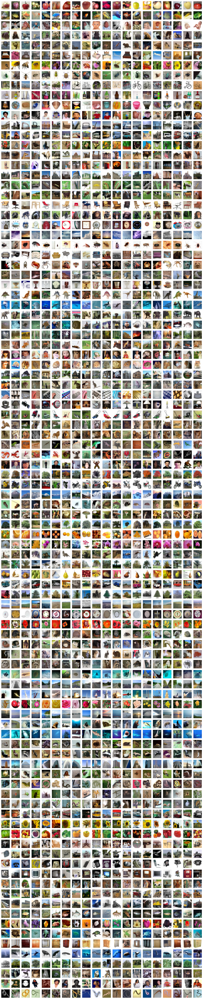

In [ ]:
# display the images using skimage
from skimage.io import imshow,imread
from matplotlib import pyplot as plt


plt.figure(1,figsize=(20,100))
count=1
for i in range(100):
  for j in range(20):
    plt.subplot(100,20,count)
    plt.imshow(X_train[img_list[i][j]].permute(1,2,0))
    plt.axis("off")
    count+=1
plt.show()

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report

lr=LogisticRegression()
lr.fit(X_train_reshaped,y_train)

lr_pred=lr.predict(X_test_rehaped)
lr_train_pred=lr.predict(X_train_reshaped)
print(f"Accuracy on Training Data : {accuracy_score(y_train,lr_train_pred)} \n")
print(f"Accuracy on Testing Data : {accuracy_score(y_test,lr_pred)} \n")
print(confusion_matrix(y_test,lr_pred))
print(classification_report(y_test,lr_pred))

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy on Training Data : 0.2677 

Accuracy on Testing Data : 0.1798 

[[30  2  0 ...  0  0  0]
 [ 0 20  1 ...  2  1  0]
 [ 1  1 11 ...  3  4  1]
 ...
 [ 0  3  2 ... 14  0  1]
 [ 1  1  3 ...  1  7  0]
 [ 0  0  1 ...  2  0  3]]
              precision    recall  f1-score   support

           0       0.34      0.30      0.32       100
           1       0.14      0.20      0.16       100
           2       0.11      0.11      0.11       100
           3       0.10      0.06      0.07       100
           4       0.06      0.04      0.05       100
           5       0.10      0.13      0.12       100
           6       0.14      0.15      0.15       100
           7       0.23      0.27      0.25       100
           8       0.17      0.13      0.15       100
           9       0.24      0.27      0.26       100
          10       0.12      0.08      0.10       100
          11       0.13      0.11      0.12       100
          12       0.18      0.17      0.17       100
          13  

In [ ]:
   0 1 2 3
0
1
2
3